In [1]:
%load_ext autoreload
%autoreload 2

In [14]:
from jax import vmap, jit
import jax.numpy as jnp
from pathlib import Path
import numpy as np
from einops import rearrange
import jax
import matplotlib.pyplot as plt
import seaborn as sns
from hflow.misc.plot import scatter_movie, imshow_movie, line_movie
import random
from functools import partial

In [3]:
from hflow.truth.sburgers import solve_sburgers,solve_sburgers_samples

In [4]:
def get_f_besov_x(key, x_space, K, s=1.0, kappa=4.0, p=2):
        d = 1
        pi = jnp.pi
        L = x_space[-1] - x_space[0]
        u0 = 0.0
        xi_k = jax.random.normal(key, shape=(2*K,))
        def sin(k):
            return jnp.sin(2*pi*k*x_space/L) * jnp.sqrt(2/L)
        def cos(k):
            return jnp.cos(2*pi*k*x_space/L) * jnp.sqrt(2/L)
        for k in range(1,K):
            u0 += (k**(-s/d-1/p+1/2) * kappa**(-1/p) ) * (xi_k[k-1] * cos(k) + xi_k[k-1+K] * sin(k))
        return u0

In [62]:
from hflow.data.ode import odeint_rk4, odeint_rk4_key, odeint_euler_key
def solve_sburgers(N, sub_N, t_eval, modes, sigma, nu, key):
    X = jnp.linspace(0.0, 1.0, N)
    def ic_fn(x):
        return jnp.squeeze(jnp.exp(-20*(x-0.5)**2))
    ic = ic_fn(X)
    dx = X[1]-X[0]
    N = len(X)
    dt = t_eval[1] 

    def extend_periodic(u):
        u_ext = jnp.zeros(N+2)
        u_ext = u_ext.at[1:-1].set(u)
        u_ext = u_ext.at[0].set(u[-1])
        u_ext = u_ext.at[-1].set(u[0])

        return u_ext

    def burgers_rhs(t, u, key):
        u = extend_periodic(u)
        f = get_f_besov_x(key, X, modes)*sigma*(1/jnp.sqrt(dt))
        u_x = ((u[1:]-u[0:-1])/dx)[:-1]
        u_xx = (u[2:] - 2*u[1:-1] + u[0:-2]) / (dx**2)
        u_t = -u[1:-1]*u_x + nu*u_xx + f
        return u_t

    def lambda_fn(y):
        return y[::sub_N]
        
    y = odeint_euler_key(burgers_rhs, ic, t_eval, key, lambda_fn=lambda_fn)

    return y




In [88]:
key = jax.random.PRNGKey(random.randint(0,1e6))

dt = 2e-4
nu = 5e-3
N = 128
sub_N = 2
Tend = 4.0

t_eval = jnp.arange(0.0, Tend, dt)
modes = 100
sigma = 1e-1

n_samples = 10
keys = jax.random.split(key, num=n_samples)
jit_solver = vmap(jit(partial(solve_sburgers, N, sub_N, t_eval, modes, sigma, nu)))
sols = jit_solver(keys)
sols = sols[:, ::100]

In [89]:
line_movie(sols)


In [90]:

def get_power_spectrum(psi):
    f, Pxx_den = jax.scipy.signal.welch(psi, len(psi)*2, 'flattop', len(psi), scaling='spectrum')
    return f, Pxx_den

In [92]:
fS, denS = vmap(get_power_spectrum)(sols[0])

In [94]:
line_movie(denS)


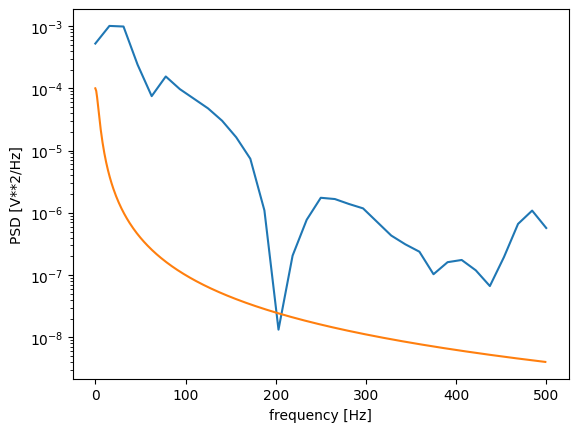

In [71]:
from scipy import signal
psi_0 = sols[0, -1]
fs = int(1e3)
N = len(psi_0)
time = np.arange(N) / fs
f, Pxx_den = signal.welch(psi_0, fs, 'flattop',  len(psi_0), scaling='spectrum')
plt.semilogy(f, Pxx_den)
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.plot(range(0, fs//2), 1e-3/(np.array(range(0, fs//2))**2+10))
plt.show()

ValueError: Axis limits cannot be NaN or Inf

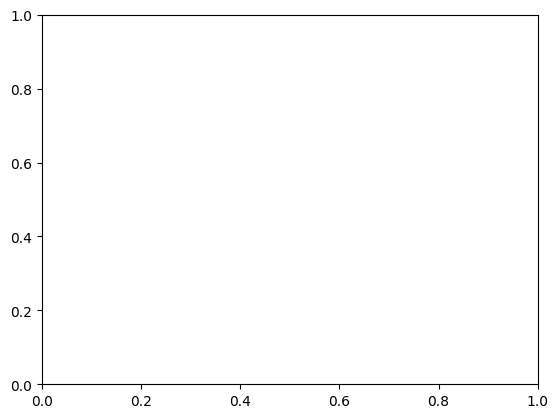

In [68]:
line_movie(sols)


In [66]:
line_movie(sols)
